In [1]:
import FalseColor_methods as fc 
from FCdataobject import DataObject
import h5py as hp
import numpy as np
import tifffile as tf
import os 
import json
import glob
import skimage.filters as filt
import time
import skimage.morphology as morph
import skimage.feature as feat
%matplotlib notebook
import matplotlib.pyplot as plt


/Users/robertserafin/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
datapath = os.path.join(os.getcwd(),'h5_sample_data')
datafile = os.path.join(datapath,'data-f0.h5')

testData = DataObject(directory=datapath)

In [ ]:
testData.setupH5data(folder=datapath)

In [4]:
channelIDs = ['s00', 's01']

In [5]:
colorSingle_runnable = {'runnable' : fc.singleChannel_falseColor}
falseColor_runnable = {'runnable' : fc.falseColor, 'kwargs' : {'channelIDs':channelIDs}}
preprocess_runnable = {'runnable' : fc.preProcess, 'kwargs' : None}
combine_runnable = {'runnable' : fc.combineFalseColoredChannels, 'args' : None}
adaptive_runnable = {'runnable' : fc.adaptiveBinary, 'kwargs': {'blocksize':21}}

In [6]:
t0 = time.time()
combined_false_colored_data = testData.processImages(falseColor_runnable,imageSet=testData.imageSet)
print(time.time()-t0)

<function falseColor at 0x1c2550c8c8> {'channelIDs': ['s00', 's01']} (1025, 717, 1025, 2)


/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:171: RuntimeWarning: invalid value encountered in power
  images = numpy.power(images,0.85)
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:179: RuntimeWarning: invalid value encountered in less
  processed_images[processed_images < 0] = 0
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:175: RuntimeWarning: invalid value encountered in greater
  image_mean = numpy.mean(images[images>thresh])*8
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:171: RuntimeWarning: invalid value encountered in power
  images = numpy.power(images,0.85)
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:175: RuntimeWarning: invalid value encountered in greater
  image_mean = numpy.mean(images[images>thresh])*8
/Users/robertserafin/Desktop/Image_analysis_code

54.34830403327942


<IPython.core.display.Javascript object>


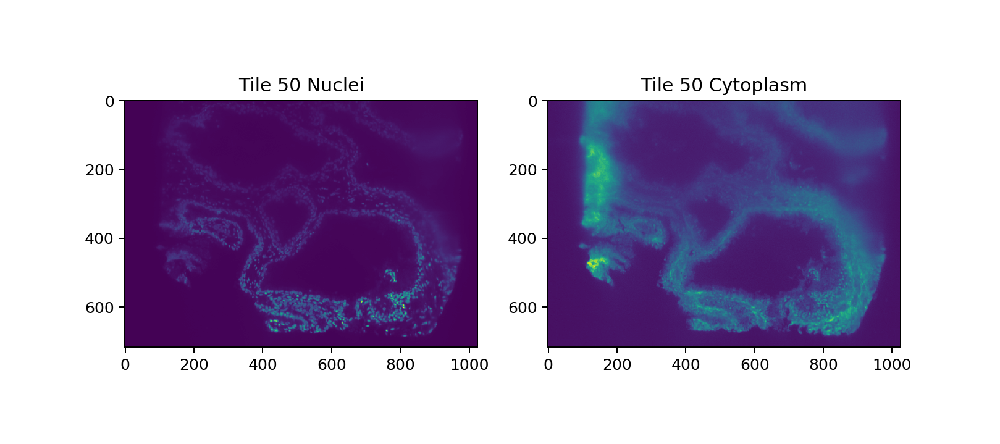

<IPython.core.display.Javascript object>


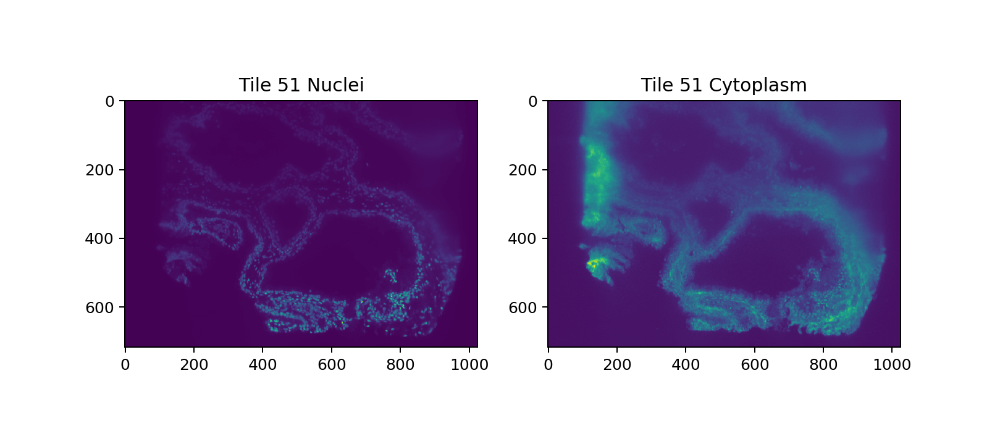

<IPython.core.display.Javascript object>


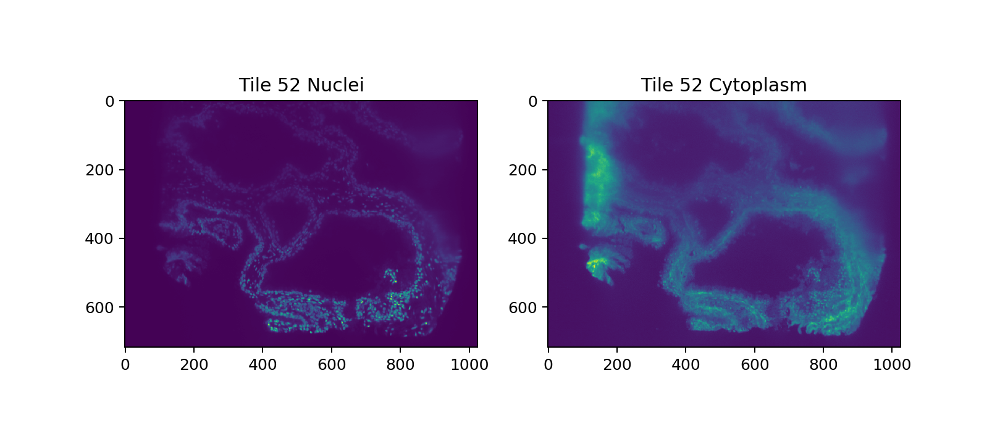

<IPython.core.display.Javascript object>


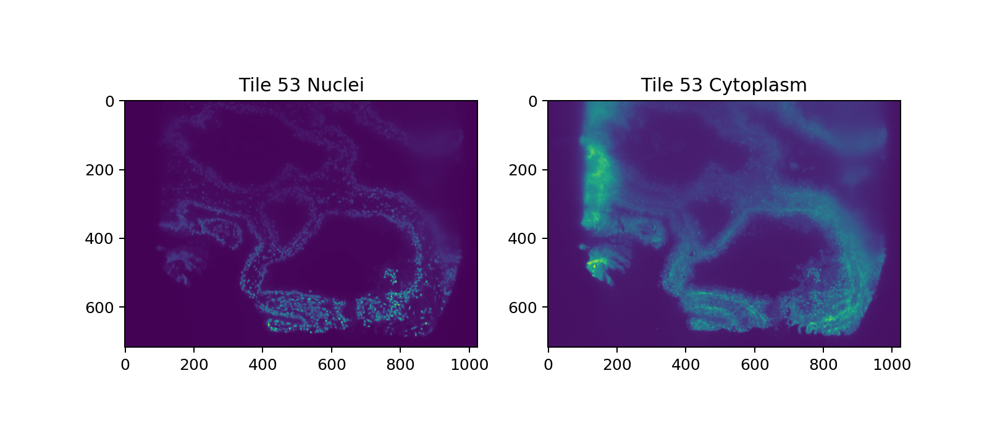

<IPython.core.display.Javascript object>


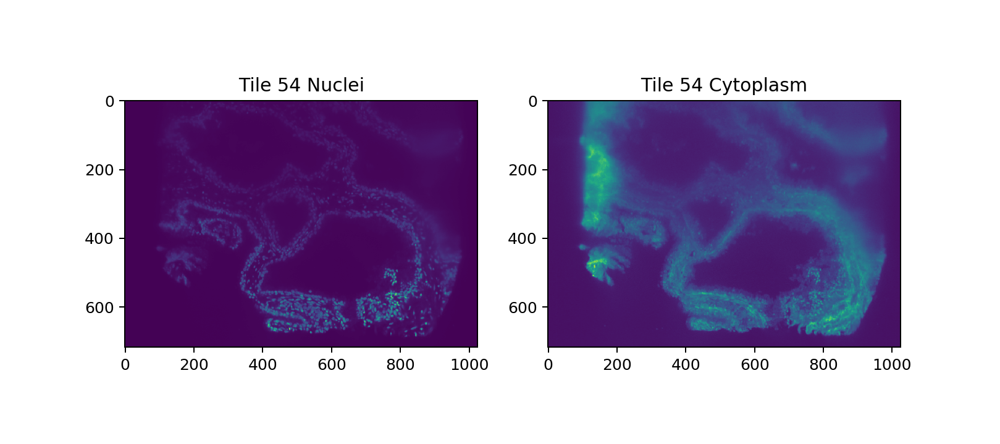

In [7]:
plt.close('all')
for i in range(50,55):
    f,ax = plt.subplots(ncols = 2, figsize = (9,4))
    ax[0].imshow(testData.imageSet[i,:,:,0])
    ax[0].set_title('Tile %s Nuclei'%(i),fontsize = 12)
    ax[1].imshow(testData.imageSet[i,:,:,1])
    ax[1].set_title('Tile %s Cytoplasm'%(i),fontsize = 12)
#     ax[1][0].imshow(combined_false_colored_data[0][i])
#     ax[1][0].set_title('False Coloring',fontsize = 12)
#     f.delaxes(ax[1][1])
#     f.suptitle('Tile %s' %(i))

<IPython.core.display.Javascript object>


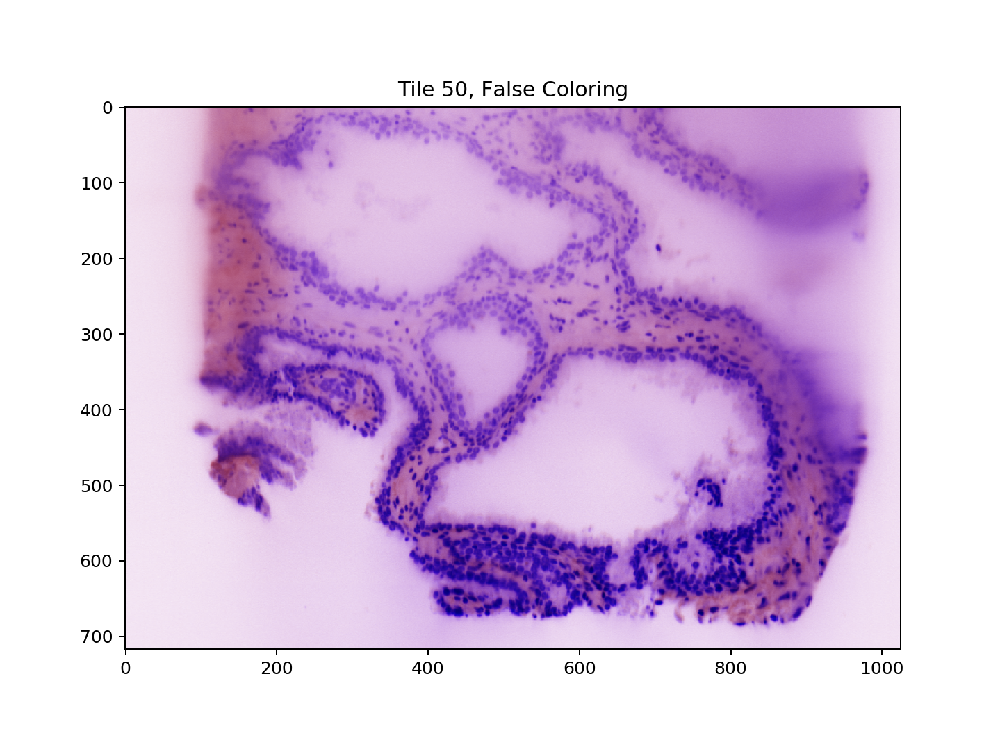

<IPython.core.display.Javascript object>


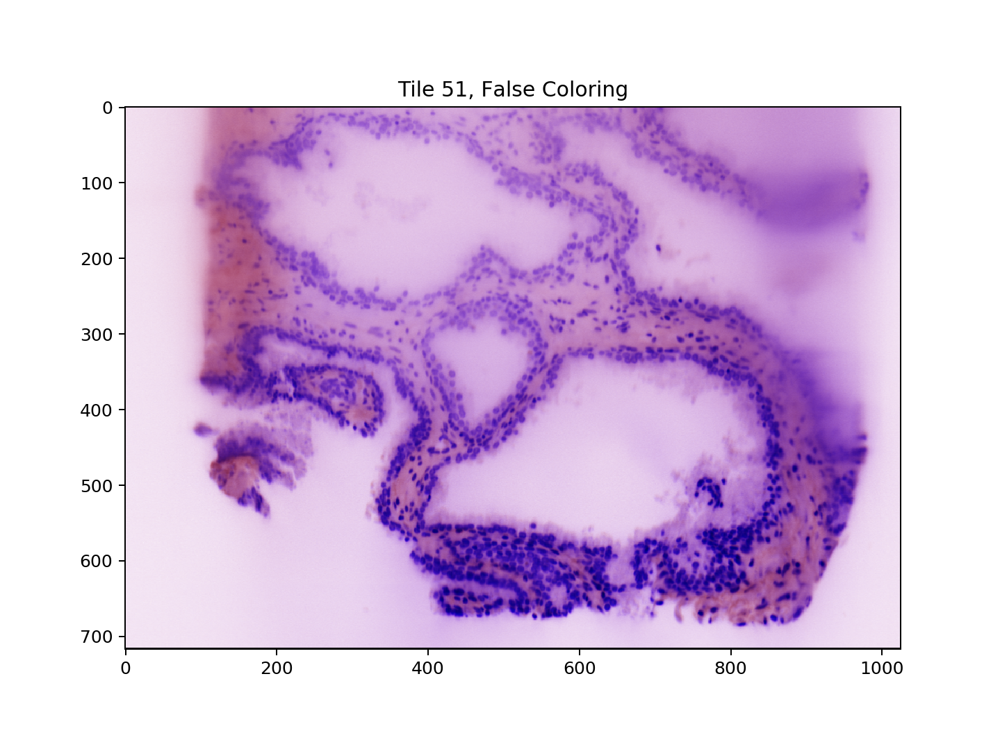

<IPython.core.display.Javascript object>


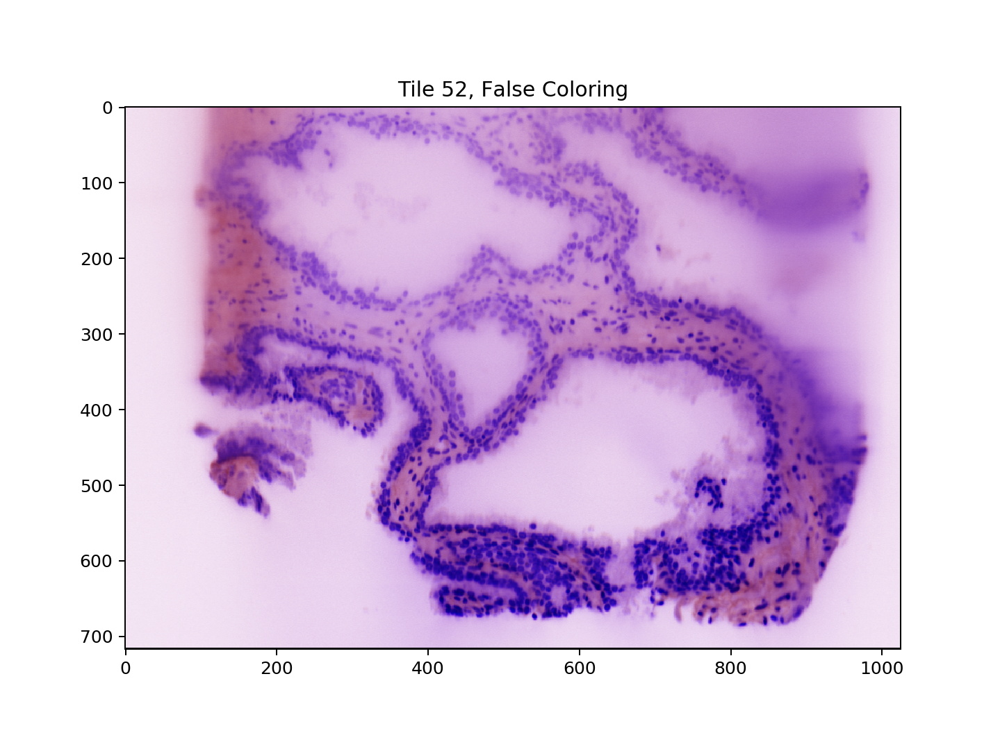

<IPython.core.display.Javascript object>


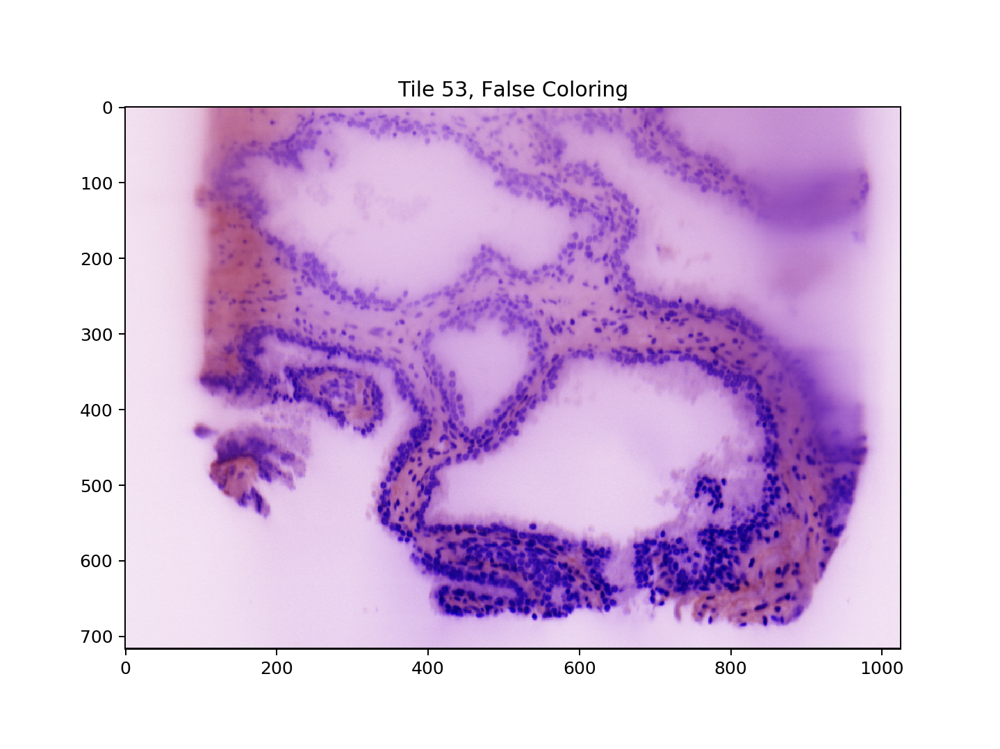

<IPython.core.display.Javascript object>


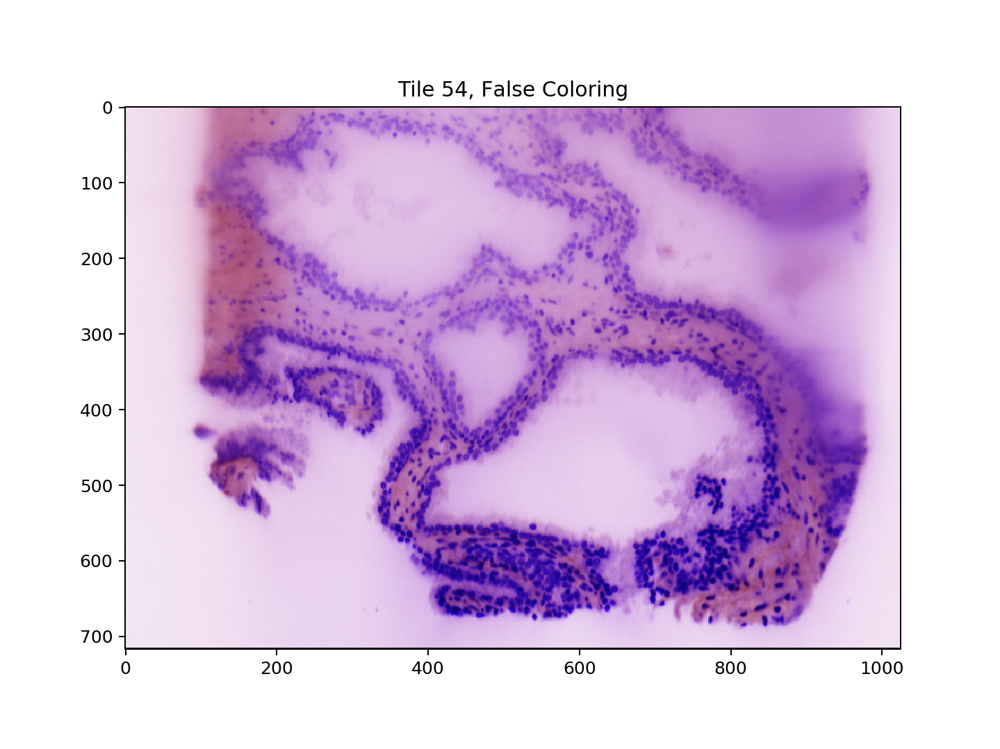

In [9]:
for i in range(50,55):
    plt.subplots(figsize = (8,6))
    plt.imshow(combined_false_colored_data[0][i])
    plt.title('Tile %s, False Coloring'%(i), fontsize = 12)

In [10]:
plt.close('all')

In [12]:
trial_set = testData.imageSet[:40]
trial_set.T.shape

(2, 1025, 717, 40)

In [14]:
binary_data = testData.processImages(adaptive_runnable,imageSet=trial_set)
binary_data = binary_data[0]
binary_data.shape

<function adaptiveBinary at 0x1c2550c9d8> {'blocksize': 21} (40, 717, 1025, 2)


NameError: name 'np' is not defined

<IPython.core.display.Javascript object>


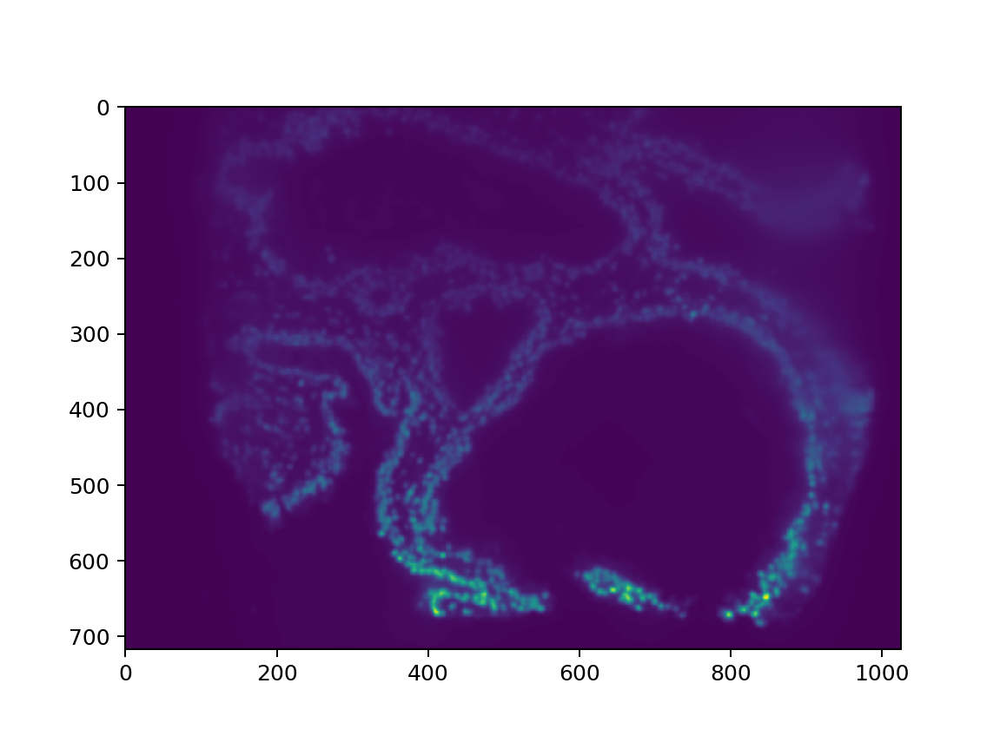

In [27]:

plt.subplots()
plt.imshow(binary_data[0][:,:,0])

In [37]:
linear_timeset = []
for j in range(10):
    print('On set: ',j)
    t = time.time()
    for i in range(len(testData.imageSet)):
        if (i % 100) == 0:
            print(i)
        fc.falseColor(testData.imageSet[i],channel_IDs)
    linear_timeset.append(time.time() - t)

On set:  0
0


/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:171: RuntimeWarning: invalid value encountered in power
  images = numpy.power(images,0.85)
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:175: RuntimeWarning: invalid value encountered in greater
  image_mean = numpy.mean(images[images>thresh])*8
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:179: RuntimeWarning: invalid value encountered in less
  processed_images[processed_images < 0] = 0


100
200
300
400
500
600
700
800
900
1000
On set:  1
0
100
200
300
400
500
600
700
800
900
1000
On set:  2
0
100
200
300
400
500
600
700
800
900
1000
On set:  3
0
100
200
300
400
500
600
700
800
900
1000
On set:  4
0
100
200
300
400
500
600
700
800
900
1000
On set:  5
0
100
200
300
400
500
600
700
800
900
1000
On set:  6
0
100
200
300
400
500
600
700
800
900
1000
On set:  7
0
100
200
300
400
500
600
700
800
900
1000
On set:  8
0
100
200
300
400
500
600
700
800
900
1000
On set:  9
0
100
200
300
400
500
600
700
800
900
1000


In [29]:
batch_timeset = []
for i in range(10):
    print(i)
    t0 = time.time()
    combined_false_colored_data = testData.processImages(falseColor_runnable,channel_IDs,singleSet=False,imageSet=testData.imageSet)
    batch_timeset.append(time.time()-t0)

0
1
2
3
4
5
6
7
8
9


In [30]:
import copy

batch_timeset_duplicate = copy.deepcopy(batch_timeset)
print(batch_timeset_duplicate)

[59.47043299674988, 52.01245307922363, 49.04718828201294, 49.74736309051514, 49.727221965789795, 51.61478805541992, 49.95790219306946, 49.001585245132446, 50.1013822555542, 48.99890995025635]


In [38]:
linear_timeset_duplicate = copy.deepcopy(linear_timeset)
print(linear_timeset_duplicate)

[90.1305742263794, 87.23316216468811, 84.08562207221985, 81.38473105430603, 79.31263327598572, 78.34552383422852, 74.36614680290222, 72.15193295478821, 70.83032202720642, 68.37054300308228]


In [32]:
testData.imageSet.shape

(1025, 717, 1025, 2)

In [35]:
testimg = fc.falseColor(testData.imageSet[0],channel_IDs)
testimg.shape

/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:171: RuntimeWarning: invalid value encountered in power
  images = numpy.power(images,0.85)
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:175: RuntimeWarning: invalid value encountered in greater
  image_mean = numpy.mean(images[images>thresh])*8
/Users/robertserafin/Desktop/Image_analysis_codebase/False Coloring/FalseColor_methods.py:179: RuntimeWarning: invalid value encountered in less
  processed_images[processed_images < 0] = 0


(717, 1025, 3)

In [25]:
batch_timeset_backup = [59.47043299674988, 52.01245307922363, 49.04718828201294, 49.74736309051514, 49.727221965789795, 51.61478805541992, 49.95790219306946, 49.001585245132446, 50.1013822555542, 48.99890995025635]

In [26]:
linear_timeset_backup = [90.1305742263794, 87.23316216468811, 84.08562207221985, 81.38473105430603, 79.31263327598572, 78.34552383422852, 74.36614680290222, 72.15193295478821, 70.83032202720642, 68.37054300308228]

In [27]:
linear_std = np.std(linear_timeset_backup)
batch_std = np.std(batch_timeset_backup)

linear_mean = np.average(linear_timeset_backup)
batch_mean = np.average(batch_timeset_backup)

print('linear mean: ', linear_mean)
print('batch mean:', batch_mean)

linear mean:  78.62111914157867
batch mean: 50.967922711372374


<IPython.core.display.Javascript object>


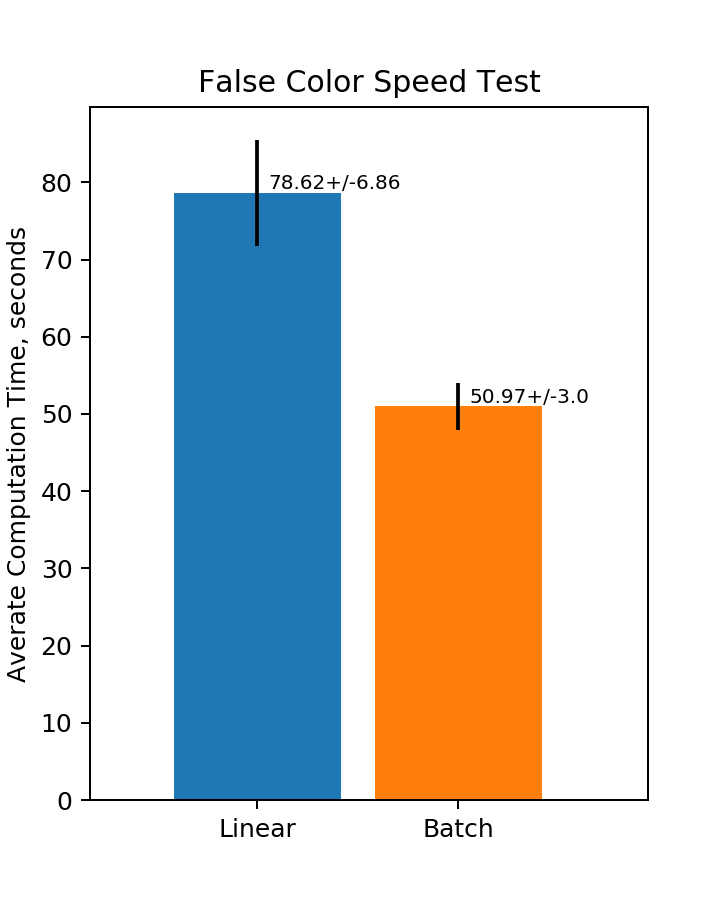

In [80]:
width = 0.15
ind = np.arange(2)

f,ax = plt.subplots(figsize = (4,5))

ax.bar(width,linear_mean,width = width, yerr = linear_std)
ax.text(width + .01,linear_mean+.5,'%s+/-%s' %(round(linear_mean,2),round(linear_std,2)),fontsize = 8)

ax.bar(2*width + .03,batch_mean,width = width,yerr = batch_std)
ax.text(2*width +.04,batch_mean+.5,  '%s+/-%s' %(round(batch_mean,2),round(batch_std,2)),fontsize=8)

ax.set_xticks([width,2*width + .03])
ax.set_xticklabels(['Linear','Batch'])
ax.set_ylabel('Averate Computation Time, seconds')
ax.set_xlim(0,.5)
plt.title('False Color Speed Test')
plt.show()